## In this notebook we will be comparing different color spaces and their effects on histogram equalization. We will be using the images provided in the course. For each color space we selected one channel, applied equalization visualized only this channel. We will be using the same function for all color spaces, so we will be able to compare the results.


In [1]:
import cv2
import numpy as np
import matplotlib
import os

from math import ceil
from matplotlib import pyplot as plt

from utils import show_histogram, equalize_comparision, equalize_comparision_separate_channels

matplotlib.rcParams['figure.figsize'] = (13, 8)

In [2]:
NUCLEI_PATH = 'Data Povid 2 cviko/Histology nuclei/'
nuclei_files = os.listdir(NUCLEI_PATH)
nuclei_files

['TCGA-18-5592-01Z-00-DX1.tif',
 'TCGA-21-5784-01Z-00-DX1.tif',
 'TCGA-21-5786-01Z-00-DX1.tif',
 'TCGA-38-6178-01Z-00-DX1.tif',
 'TCGA-49-4488-01Z-00-DX1.tif',
 'TCGA-50-5931-01Z-00-DX1.tif']

In [3]:
nuclei_images = [cv2.imread(NUCLEI_PATH + file) for file in nuclei_files]

For color space BGR (RGB) we can see that the results are very similar.

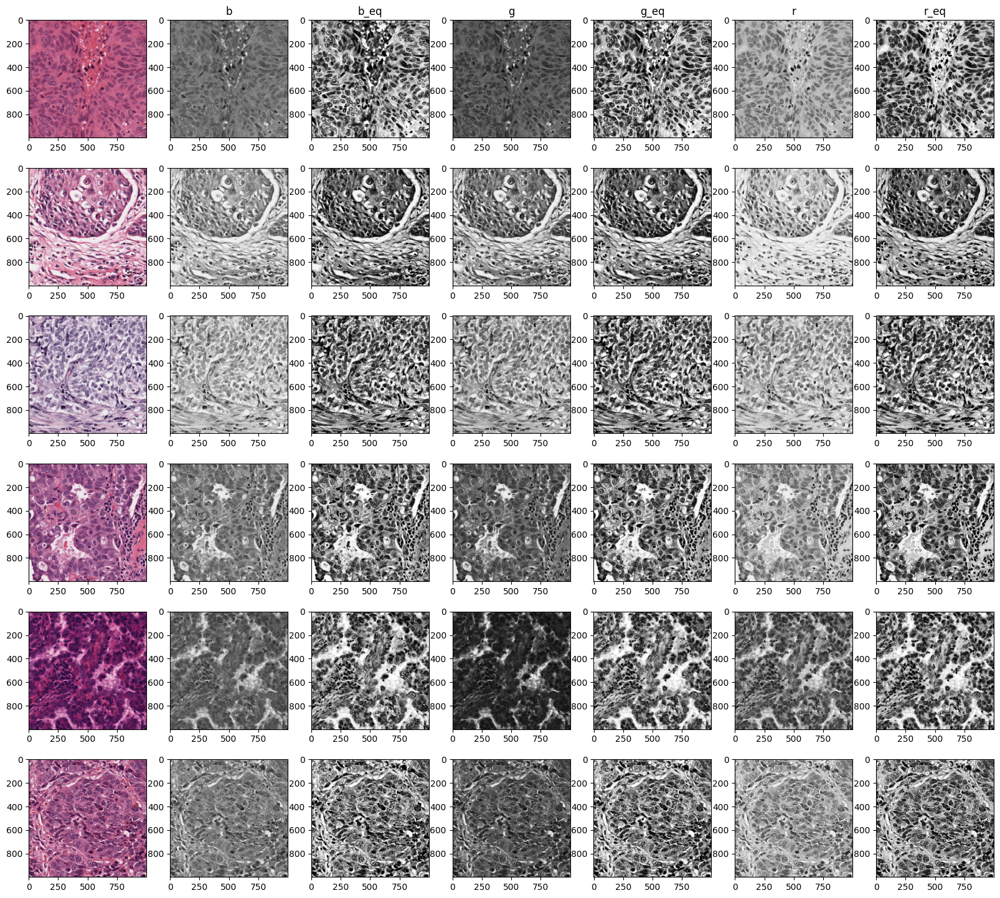

In [4]:
bgr_nuclei = nuclei_images.copy()
equalize_comparision_separate_channels(bgr_nuclei, ["b", "g", "r"], cv2.COLOR_BGR2RGB)

For color space HSV we can see that the results are very different. Channel H is not optimal because in this channel are not enough information about cells and even after equalization, the result is not good. Channel S is even worse. Channel V is the best, because it contains the most information about cells, so after equalization the result is the best.

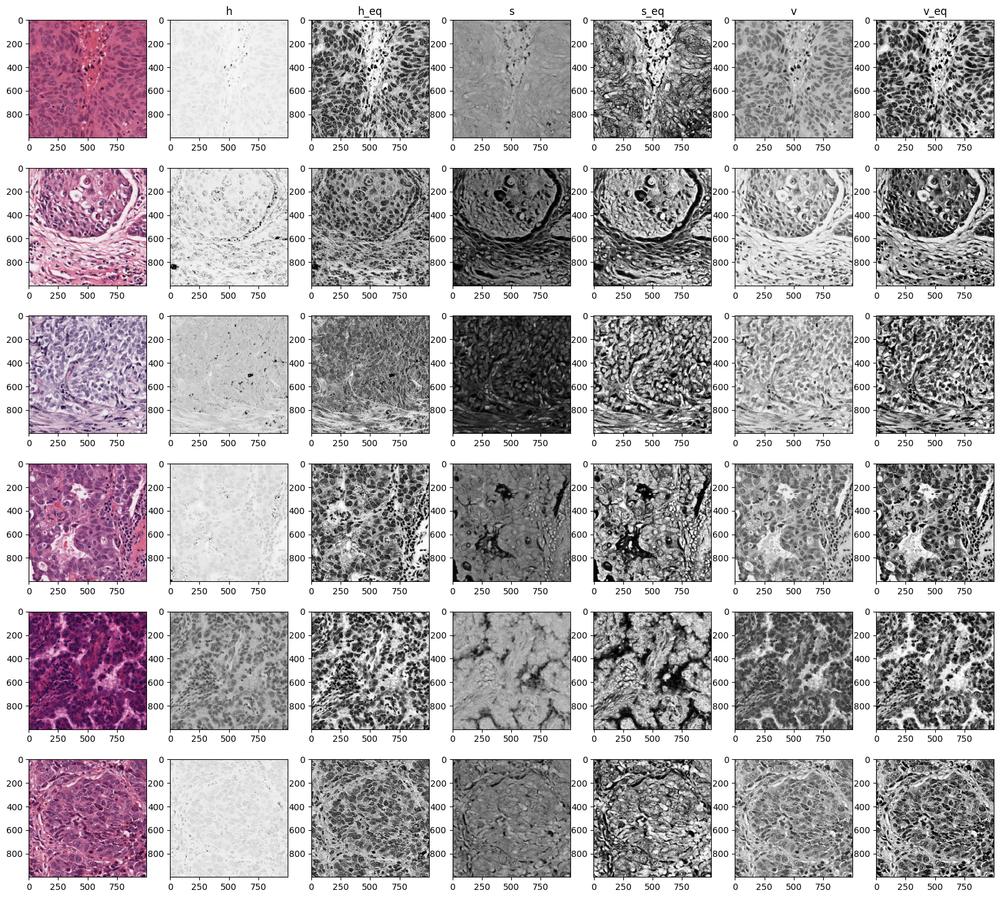

In [5]:
nuclei_copy = nuclei_images.copy()
hsv_nucleis = [cv2.cvtColor(image, cv2.COLOR_BGR2HSV) for image in nuclei_copy]
equalize_comparision_separate_channels(hsv_nucleis, ["h", "s", "v"], cv2.COLOR_HSV2RGB)

With lab color space we can achieve the best results so far. Channel L is the best, the contrast after equalization superior to the other channels. Channel A and B are not satisfactory.

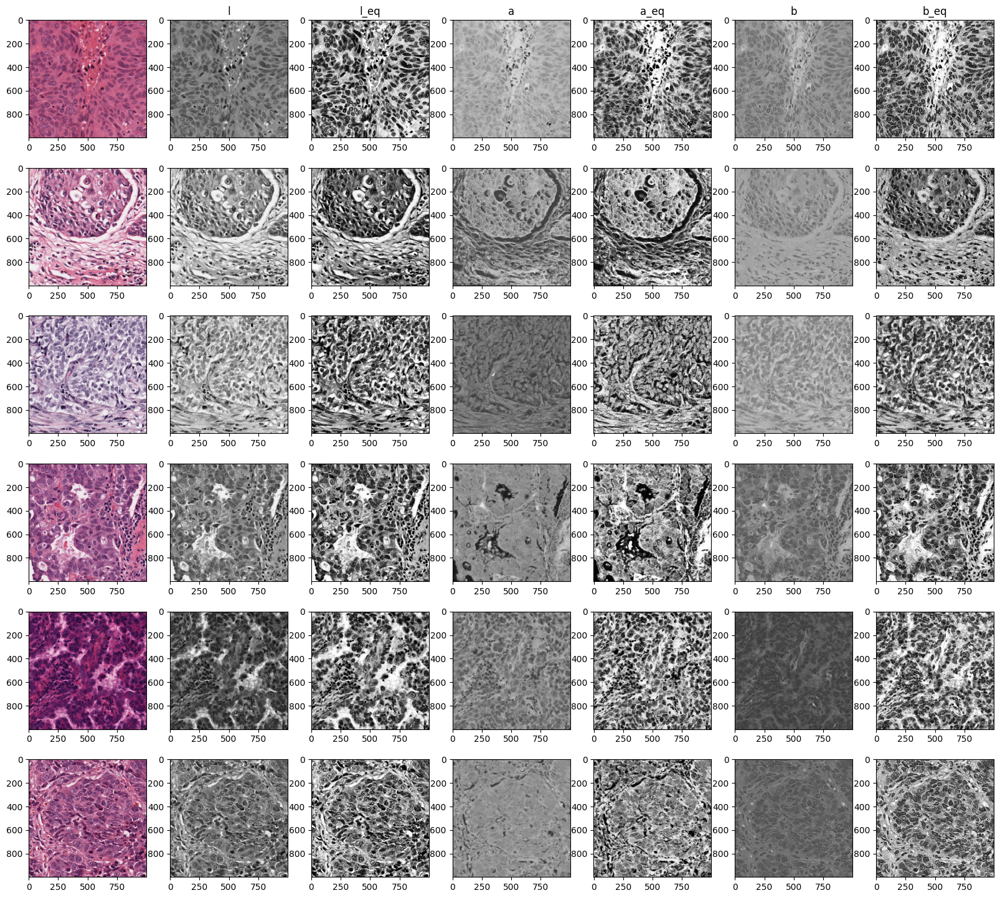

In [6]:
nuclei_copy = nuclei_images.copy()
lab_nucleis = [cv2.cvtColor(image, cv2.COLOR_BGR2Lab) for image in nuclei_copy]
equalize_comparision_separate_channels(lab_nucleis, ["l", "a", "b"], cv2.COLOR_Lab2RGB)

Color space YCrCb provided good results for channels Y and Cr. Channel Cb is not satisfactory. In direct comparison between Y and Cr, we can see that the contrast and information is better in channel Y for segmentation purposes.

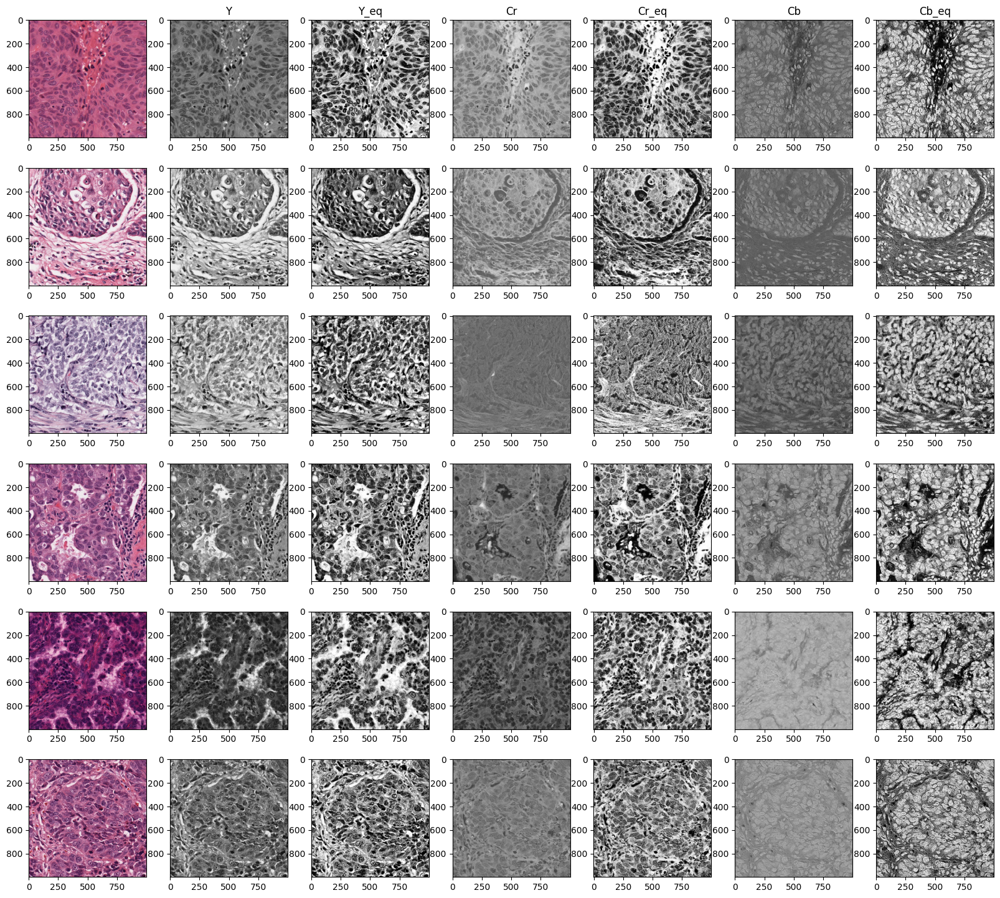

In [7]:
nuclei_copy = nuclei_images.copy()
ycrcb_nucleis = [cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb) for image in nuclei_copy]
equalize_comparision_separate_channels(ycrcb_nucleis, ["Y", "Cr", "Cb"], cv2.COLOR_YCrCb2RGB)

For color space XYZ we can see that the results are very similar to the across the channels but slightly better for channel Y.

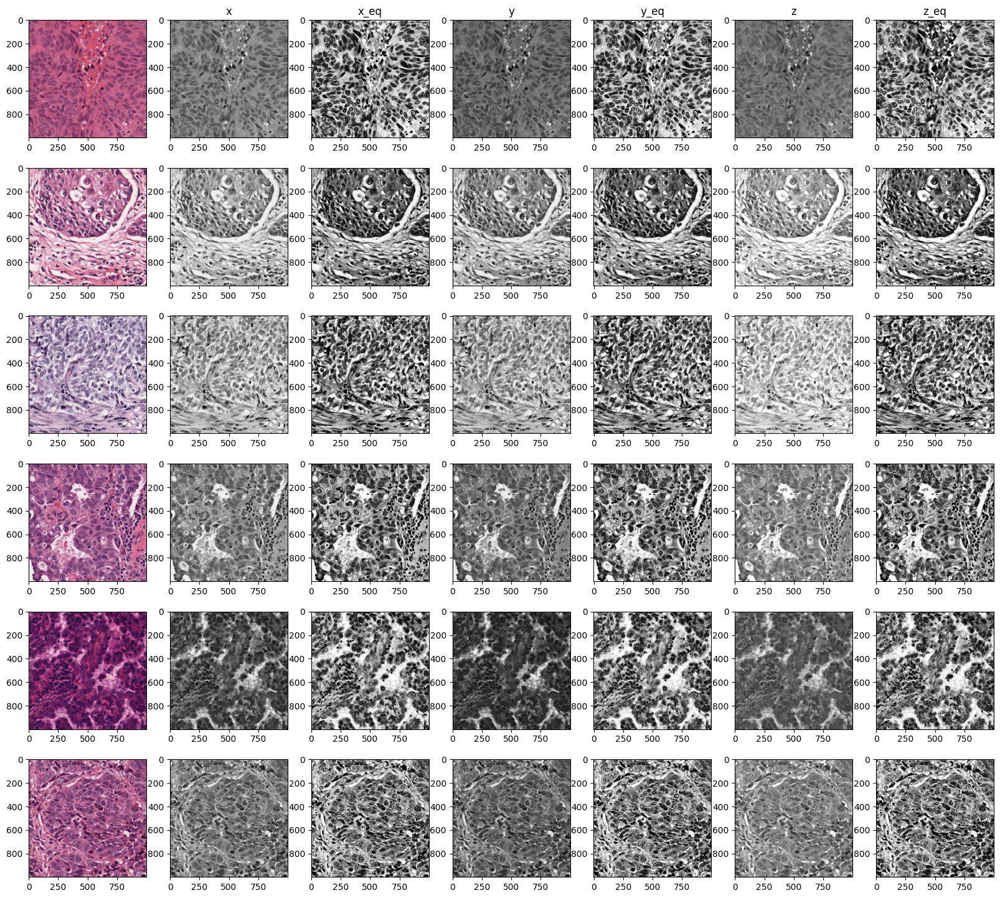

In [8]:
nuclei_copy = nuclei_images.copy()
xyz_nucleis = [cv2.cvtColor(image, cv2.COLOR_BGR2XYZ) for image in nuclei_copy]
equalize_comparision_separate_channels(xyz_nucleis, ["x", "y", "z"], cv2.COLOR_XYZ2RGB)